# Human3.6M Dataset Analysis

This notebook analyzes the Human3.6M motion capture dataset for the HumanMAC implementation.

**Objectives:**
- Load and inspect data structure
- Extract skeleton information
- Compute statistics and quality metrics
- Visualize motion sequences
- Export metadata for project use

**Dataset Files:**
- `data_3d_h36m.npz` - Training data
- `data_3d_h36m_test.npz` - Test data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D

# Set plotting style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

# Data paths
data_dir = Path('../data')
train_file = data_dir / 'data_3d_h36m.npz'
test_file = data_dir / 'data_3d_h36m_test.npz'

print(f"Train file exists: {train_file.exists()}")
print(f"Test file exists: {test_file.exists()}")

Train file exists: True
Test file exists: True


### Load NPZ Files
Load training and test data, inspect keys and structure.

In [2]:
# Load training data
train_data = np.load(train_file, allow_pickle=True)

print("Available keys in training data:")
print(train_data.keys())
print("\n" + "="*50)

# Convert keys to list for better display
keys_list = list(train_data.keys())

print(f"Number of keys: {len(keys_list)}")
print("\nKey names:")
for i, key in enumerate(keys_list, 1):
    print(f"{i}. {key}")


# Extract positions data
positions_3d = train_data['positions_3d']

print(f"Data type: {type(positions_3d)}")
print(f"Shape: {positions_3d.shape if hasattr(positions_3d, 'shape') else 'N/A'}")
print(f"Dtype: {positions_3d.dtype if hasattr(positions_3d, 'dtype') else 'N/A'}")

# If it's an object array or dict, inspect further
if positions_3d.dtype == object:
    print("\n" + "="*50)
    print("This is an object array. Inspecting first element...")
    print(f"Type of first element: {type(positions_3d.item())}")

Available keys in training data:
KeysView(<numpy.lib.npyio.NpzFile object at 0x77ef8b07ba30>)

Number of keys: 1

Key names:
1. positions_3d
Data type: <class 'numpy.ndarray'>
Shape: ()
Dtype: object

This is an object array. Inspecting first element...
Type of first element: <class 'dict'>


In [3]:
# Extract the dictionary
data_dict = positions_3d.item()

print(f"Dictionary keys (subjects/categories):")
print(f"Number of keys: {len(data_dict.keys())}")
print("\nKeys:")
for key in sorted(data_dict.keys()):
    print(f"  - {key}")

Dictionary keys (subjects/categories):
Number of keys: 7

Keys:
  - S1
  - S11
  - S5
  - S6
  - S7
  - S8
  - S9


In [4]:
# Inspect structure under first subject
subject_key = 'S1'
subject_data = data_dict[subject_key]

print(f"Subject: {subject_key}")
print(f"Type: {type(subject_data)}")

if isinstance(subject_data, dict):
    print(f"\nNumber of actions: {len(subject_data.keys())}")
    print("\nAction keys:")
    for action_key in sorted(subject_data.keys()):
        print(f"  - {action_key}")

Subject: S1
Type: <class 'dict'>

Number of actions: 30

Action keys:
  - Directions
  - Directions 1
  - Discussion
  - Discussion 1
  - Eating
  - Eating 2
  - Greeting
  - Greeting 1
  - Phoning
  - Phoning 1
  - Photo
  - Photo 1
  - Posing
  - Posing 1
  - Purchases
  - Purchases 1
  - Sitting 1
  - Sitting 2
  - SittingDown
  - SittingDown 2
  - Smoking
  - Smoking 1
  - Waiting
  - Waiting 1
  - WalkDog
  - WalkDog 1
  - WalkTogether
  - WalkTogether 1
  - Walking
  - Walking 1


In [5]:
# Inspect data under one action
subject_key = 'S1'
action_key = 'Walking'
action_data = subject_data[action_key]

print(f"Subject: {subject_key}, Action: {action_key}")
print(f"Type: {type(action_data)}")
print(f"Shape: {action_data.shape}")
print(f"Dtype: {action_data.dtype}")
print(f"\nData dimensions: {action_data.ndim}D array")
print(f"Interpretation: {action_data.shape[0]} frames × {action_data.shape[1]} joints × {action_data.shape[2]} coordinates (xyz)")

Subject: S1, Action: Walking
Type: <class 'numpy.ndarray'>
Shape: (3134, 32, 3)
Dtype: float32

Data dimensions: 3D array
Interpretation: 3134 frames × 32 joints × 3 coordinates (xyz)


## Dataset Stats Overview

In [6]:
# Collect dataset statistics
train_stats = {
    'subjects': [],
    'actions': [],
    'num_frames': [],
    'subject_action': []
}

for subject in sorted(data_dict.keys()):
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        train_stats['subjects'].append(subject)
        train_stats['actions'].append(action)
        train_stats['num_frames'].append(sequence.shape[0])
        train_stats['subject_action'].append(f"{subject}_{action}")

# Convert to DataFrame
train_df = pd.DataFrame(train_stats)

print(f"Total sequences in training set: {len(train_df)}")
print(f"\nSequences per subject:")
print(train_df['subjects'].value_counts().sort_index())

Total sequences in training set: 209

Sequences per subject:
subjects
S1     30
S11    29
S5     30
S6     30
S7     30
S8     30
S9     30
Name: count, dtype: int64


### Extract base action categories (without trial numbers) and show sequence length statistics.

In [7]:
# Extract base actions (remove trial numbers)
train_df['base_action'] = train_df['actions'].str.replace(r' \d+$', '', regex=True)

print("Unique base actions:")
unique_actions = sorted(train_df['base_action'].unique())
for i, action in enumerate(unique_actions, 1):
    count = (train_df['base_action'] == action).sum()
    print(f"{i:2d}. {action:20s} ({count:3d} sequences)")

print(f"\nTotal unique base actions: {len(unique_actions)}")
print("\n" + "="*50)
print("\nSequence length statistics:")
print(train_df['num_frames'].describe())

Unique base actions:
 1. Directions           ( 13 sequences)
 2. Discussion           ( 14 sequences)
 3. Eating               ( 14 sequences)
 4. Greeting             ( 14 sequences)
 5. Phoning              ( 14 sequences)
 6. Photo                ( 14 sequences)
 7. Posing               ( 14 sequences)
 8. Purchases            ( 14 sequences)
 9. Sitting              ( 14 sequences)
10. SittingDown          ( 14 sequences)
11. Smoking              ( 14 sequences)
12. Waiting              ( 14 sequences)
13. WalkDog              ( 14 sequences)
14. WalkTogether         ( 14 sequences)
15. Walking              ( 14 sequences)

Total unique base actions: 15


Sequence length statistics:
count     209.000000
mean     2515.665072
std      1102.183943
min       992.000000
25%      1662.000000
50%      2266.000000
75%      3023.000000
max      6343.000000
Name: num_frames, dtype: float64


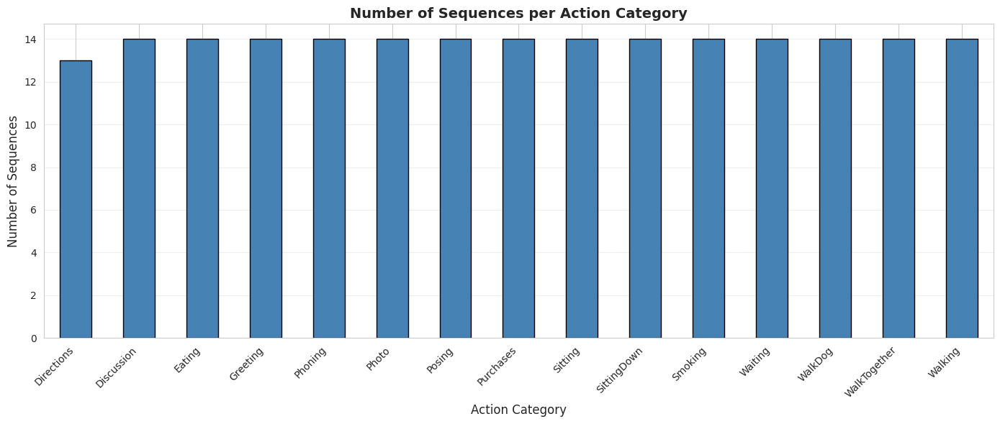

Most common action: Discussion (14 sequences)
Least common action: Directions (13 sequences)


In [8]:
# Bar chart showing number of sequences per base action
action_counts = train_df['base_action'].value_counts().sort_index()

plt.figure(figsize=(14, 6))
action_counts.plot(kind='bar', color='steelblue', edgecolor='black')
plt.title('Number of Sequences per Action Category', fontsize=14, fontweight='bold')
plt.xlabel('Action Category', fontsize=12)
plt.ylabel('Number of Sequences', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Most common action: {action_counts.idxmax()} ({action_counts.max()} sequences)")
print(f"Least common action: {action_counts.idxmin()} ({action_counts.min()} sequences)")

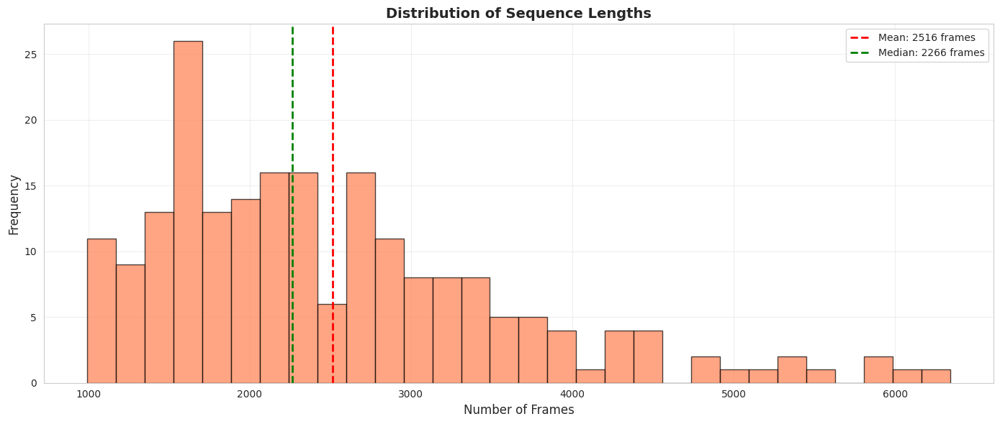

Shortest sequence: 992 frames
Longest sequence: 6343 frames


In [9]:
# Histogram showing distribution of sequence lengths
plt.figure(figsize=(14, 6))
plt.hist(train_df['num_frames'], bins=30, color='coral', edgecolor='black', alpha=0.7)
plt.axvline(train_df['num_frames'].mean(), color='red', linestyle='--', 
            linewidth=2, label=f'Mean: {train_df["num_frames"].mean():.0f} frames')
plt.axvline(train_df['num_frames'].median(), color='green', linestyle='--', 
            linewidth=2, label=f'Median: {train_df["num_frames"].median():.0f} frames')
plt.title('Distribution of Sequence Lengths', fontsize=14, fontweight='bold')
plt.xlabel('Number of Frames', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend(fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Shortest sequence: {train_df['num_frames'].min()} frames")
print(f"Longest sequence: {train_df['num_frames'].max()} frames")

In [10]:
# Inspect test file structure
test_data = np.load(test_file, allow_pickle=True)

print("Available keys in test data:")
print(list(test_data.keys()))
print("\n" + "="*50)

# Inspect each key
for key in test_data.keys():
    data = test_data[key]
    print(f"\nKey: {key}")
    print(f"Type: {type(data)}")
    print(f"Shape: {data.shape if hasattr(data, 'shape') else 'N/A'}")
    print(f"Dtype: {data.dtype if hasattr(data, 'dtype') else 'N/A'}")
    
    # If it's an object or small enough, show more details
    if data.dtype == object or (hasattr(data, 'shape') and data.size < 10):
        print(f"Content preview: {data}")

Available keys in test data:
['data']


Key: data
Type: <class 'numpy.ndarray'>
Shape: (5168, 125, 48)
Dtype: float32


In [11]:
# Load and analyze test set (different structure)
test_data = np.load(test_file, allow_pickle=True)
test_array = test_data['data']  # Shape: (num_sequences, num_frames, num_features)

# Test data statistics
test_num_sequences = test_array.shape[0]
test_num_frames_per_seq = test_array.shape[1]
test_num_features = test_array.shape[2]
test_total_frames = test_num_sequences * test_num_frames_per_seq

# Infer number of joints (features = joints * 3 coordinates)
test_num_joints = test_num_features // 3
train_num_joints = 32  # From earlier inspection

# Create summary comparison table
summary_data = {
    'Dataset': ['Training', 'Test'],
    'Total Sequences': [len(train_df), test_num_sequences],
    'Total Frames': [train_df['num_frames'].sum(), test_total_frames],
    'Unique Subjects': [train_df['subjects'].nunique(), 'N/A (preprocessed)'],
    'Unique Actions': [train_df['base_action'].nunique(), 'N/A (preprocessed)'],
    'Avg Seq Length': [f"{train_df['num_frames'].mean():.0f}", test_num_frames_per_seq],
    'Num Joints': [train_num_joints, test_num_joints]
}

summary_table = pd.DataFrame(summary_data)
print("="*70)
print("Train/Test Split Summary")
print("="*70)
print(summary_table.to_string(index=False))
print("="*70)
print(f"\nNote: Test data is preprocessed into fixed-length sequences of {test_num_frames_per_seq} frames")
print(f"Test data uses {test_num_joints} joints vs. training data's {train_num_joints} joints")

Train/Test Split Summary
 Dataset  Total Sequences  Total Frames    Unique Subjects     Unique Actions Avg Seq Length  Num Joints
Training              209        525774                  7                 15           2516          32
    Test             5168        646000 N/A (preprocessed) N/A (preprocessed)            125          16

Note: Test data is preprocessed into fixed-length sequences of 125 frames
Test data uses 16 joints vs. training data's 32 joints


## Data Format Documentation

Extract skeleton structure, joint information, and coordinate system details. This information will be saved to metadata file.

### From una-dinosauria's 3d-pose-baseline repository
### Only these indices have defined joints (17 total):
    Index  0: Hip         (root/pelvis)
    Index  1: RHip        (right hip)
    Index  2: RKnee       (right knee)
    Index  3: RFoot       (right foot/ankle)
    Index  6: LHip        (left hip)
    Index  7: LKnee       (left knee) 
    Index  8: LFoot       (left foot/ankle)
    Index 12: Spine       (lower spine)
    Index 13: Thorax      (upper spine/chest)
    Index 14: Neck/Nose   (neck junction)
    Index 15: Head        (head top)
    Index 17: LShoulder   (left shoulder)
    Index 18: LElbow      (left elbow)
    Index 19: LWrist      (left wrist)
    Index 25: RShoulder   (right shoulder)
    Index 26: RElbow      (right elbow)
    Index 27: RWrist      (right wrist)

### Indices 4,5,9,10,11,16,20-24,28-31 are empty or unused

In [12]:
# Human3.6M skeleton based on official dataset and una-dinosauria repository
# Source: https://github.com/una-dinosauria/3d-pose-baseline
# Only 17 out of 32 joints are actively used in research

# Full 32-joint array (many indices are empty/unused)
h36m_joint_names = [''] * 32
h36m_joint_names[0] = 'Hip'
h36m_joint_names[1] = 'RHip'
h36m_joint_names[2] = 'RKnee'
h36m_joint_names[3] = 'RFoot'
h36m_joint_names[6] = 'LHip'
h36m_joint_names[7] = 'LKnee'
h36m_joint_names[8] = 'LFoot'
h36m_joint_names[12] = 'Spine'
h36m_joint_names[13] = 'Thorax'
h36m_joint_names[14] = 'Neck/Nose'
h36m_joint_names[15] = 'Head'
h36m_joint_names[17] = 'LShoulder'
h36m_joint_names[18] = 'LElbow'
h36m_joint_names[19] = 'LWrist'
h36m_joint_names[25] = 'RShoulder'
h36m_joint_names[26] = 'RElbow'
h36m_joint_names[27] = 'RWrist'

# Extract only active joints (non-empty)
active_joints = [(i, name) for i, name in enumerate(h36m_joint_names) if name != '']

print(f"Total joints in dataset: 32")
print(f"Active joints used in research: {len(active_joints)}")
print("\nActive joint mapping:")
for idx, name in active_joints:
    print(f"  Index {idx:2d}: {name}")

Total joints in dataset: 32
Active joints used in research: 17

Active joint mapping:
  Index  0: Hip
  Index  1: RHip
  Index  2: RKnee
  Index  3: RFoot
  Index  6: LHip
  Index  7: LKnee
  Index  8: LFoot
  Index 12: Spine
  Index 13: Thorax
  Index 14: Neck/Nose
  Index 15: Head
  Index 17: LShoulder
  Index 18: LElbow
  Index 19: LWrist
  Index 25: RShoulder
  Index 26: RElbow
  Index 27: RWrist


In [13]:
# Skeleton connectivity - defines which joints are connected (bones)
# Format: (parent_joint_index, child_joint_index)

h36m_skeleton_connections = [
    # Right leg chain: Hip → RHip → RKnee → RFoot
    (0, 1), (1, 2), (2, 3),
    
    # Left leg chain: Hip → LHip → LKnee → LFoot  
    (0, 6), (6, 7), (7, 8),
    
    # Spine chain: Hip → Spine → Thorax → Neck → Head
    (0, 12), (12, 13), (13, 14), (14, 15),
    
    # Left arm chain: Thorax → LShoulder → LElbow → LWrist
    (13, 17), (17, 18), (18, 19),
    
    # Right arm chain: Thorax → RShoulder → RElbow → RWrist
    (13, 25), (25, 26), (26, 27)
]

print("Skeleton Connectivity (Bone Connections)")
print("="*60)
print(f"Total bones: {len(h36m_skeleton_connections)}\n")

# Group by body part
print("Right Leg: Hip(0) → RHip(1) → RKnee(2) → RFoot(3)")
print("Left Leg:  Hip(0) → LHip(6) → LKnee(7) → LFoot(8)")
print("Spine:     Hip(0) → Spine(12) → Thorax(13) → Neck(14) → Head(15)")
print("Left Arm:  Thorax(13) → LShoulder(17) → LElbow(18) → LWrist(19)")
print("Right Arm: Thorax(13) → RShoulder(25) → RElbow(26) → RWrist(27)")
print("="*60)

Skeleton Connectivity (Bone Connections)
Total bones: 16

Right Leg: Hip(0) → RHip(1) → RKnee(2) → RFoot(3)
Left Leg:  Hip(0) → LHip(6) → LKnee(7) → LFoot(8)
Spine:     Hip(0) → Spine(12) → Thorax(13) → Neck(14) → Head(15)
Left Arm:  Thorax(13) → LShoulder(17) → LElbow(18) → LWrist(19)
Right Arm: Thorax(13) → RShoulder(25) → RElbow(26) → RWrist(27)


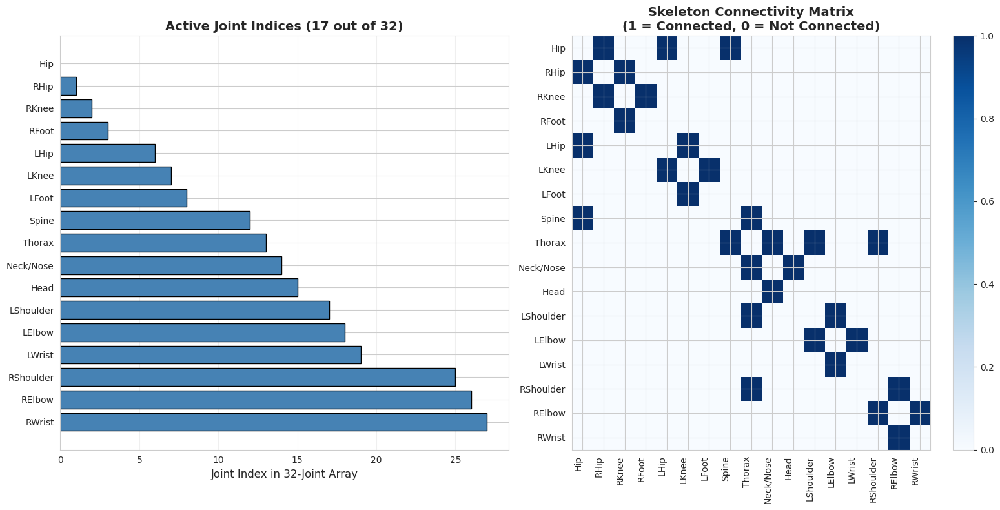

White/Light = No connection, Blue/Dark = Connected joints


In [14]:
# Create visual representation of skeleton hierarchy
import matplotlib.pyplot as plt
import numpy as np

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# Left plot: Show active joint indices
active_indices = [i for i, name in enumerate(h36m_joint_names) if name != '']
ax1.barh(range(len(active_indices)), active_indices, color='steelblue', edgecolor='black')
ax1.set_yticks(range(len(active_indices)))
ax1.set_yticklabels([h36m_joint_names[i] for i in active_indices])
ax1.set_xlabel('Joint Index in 32-Joint Array', fontsize=12)
ax1.set_title('Active Joint Indices (17 out of 32)', fontsize=14, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)
ax1.invert_yaxis()

# Right plot: Skeleton connectivity matrix
connection_matrix = np.zeros((32, 32))
for parent, child in h36m_skeleton_connections:
    connection_matrix[parent, child] = 1
    connection_matrix[child, parent] = 1  # Symmetric

# Show only active joints
active_conn = connection_matrix[np.ix_(active_indices, active_indices)]
im = ax2.imshow(active_conn, cmap='Blues', aspect='auto')
ax2.set_xticks(range(len(active_indices)))
ax2.set_yticks(range(len(active_indices)))
ax2.set_xticklabels([h36m_joint_names[i] for i in active_indices], rotation=90, ha='right')
ax2.set_yticklabels([h36m_joint_names[i] for i in active_indices])
ax2.set_title('Skeleton Connectivity Matrix\n(1 = Connected, 0 = Not Connected)', 
              fontsize=14, fontweight='bold')
plt.colorbar(im, ax=ax2)

plt.tight_layout()
plt.show()

print("White/Light = No connection, Blue/Dark = Connected joints")

### Coordinate System & Temporal Information

Document the coordinate system, frame rate, and dimensional structure of the dataset.

In [15]:
# Analyze coordinate system from sample data
subject = 'S1'
action = 'Walking'
sample_sequence = data_dict[subject][action]

# Extract coordinate statistics
coords_x = sample_sequence[:, :, 0]  # X coordinates
coords_y = sample_sequence[:, :, 1]  # Y coordinates  
coords_z = sample_sequence[:, :, 2]  # Z coordinates

print("="*60)
print("Coordinate System Information")
print("="*60)
print(f"Data format: (frames, joints, coordinates)")
print(f"Sample shape: {sample_sequence.shape}")
print(f"Coordinates: XYZ (3D Cartesian)")
print(f"Units: millimeters (mm)")
print("\nCoordinate ranges for sample sequence (Walking):")
print(f"  X-axis: [{coords_x.min():.1f}, {coords_x.max():.1f}] mm")
print(f"  Y-axis: [{coords_y.min():.1f}, {coords_y.max():.1f}] mm")
print(f"  Z-axis: [{coords_z.min():.1f}, {coords_z.max():.1f}] mm")
print("\nCoordinate system convention:")
print("  - Origin: Hip joint (index 0)")
print("  - X-axis: Left-Right (positive = right)")
print("  - Y-axis: Up-Down (positive = up)")
print("  - Z-axis: Forward-Backward (positive = forward)")
print("="*60)

Coordinate System Information
Data format: (frames, joints, coordinates)
Sample shape: (3134, 32, 3)
Coordinates: XYZ (3D Cartesian)
Units: millimeters (mm)

Coordinate ranges for sample sequence (Walking):
  X-axis: [-0.8, 1.6] mm
  Y-axis: [-1.7, 2.7] mm
  Z-axis: [0.0, 1.6] mm

Coordinate system convention:
  - Origin: Hip joint (index 0)
  - X-axis: Left-Right (positive = right)
  - Y-axis: Up-Down (positive = up)
  - Z-axis: Forward-Backward (positive = forward)


In [16]:
# Frame rate information for Human3.6M
# Source: Official Human3.6M dataset documentation

frame_rate = 50  # Hz (frames per second)
frame_duration = 1000 / frame_rate  # milliseconds

print("="*60)
print("Temporal Information")
print("="*60)
print(f"Frame rate: {frame_rate} Hz (fps)")
print(f"Frame duration: {frame_duration} ms")
print(f"Temporal resolution: {1/frame_rate:.4f} seconds/frame")
print("\nSequence duration analysis:")
print(f"  Shortest sequence: {train_df['num_frames'].min()} frames = {train_df['num_frames'].min()/frame_rate:.2f} seconds")
print(f"  Longest sequence: {train_df['num_frames'].max()} frames = {train_df['num_frames'].max()/frame_rate:.2f} seconds")
print(f"  Average sequence: {train_df['num_frames'].mean():.0f} frames = {train_df['num_frames'].mean()/frame_rate:.2f} seconds")
print("="*60)

Temporal Information
Frame rate: 50 Hz (fps)
Frame duration: 20.0 ms
Temporal resolution: 0.0200 seconds/frame

Sequence duration analysis:
  Shortest sequence: 992 frames = 19.84 seconds
  Longest sequence: 6343 frames = 126.86 seconds
  Average sequence: 2516 frames = 50.31 seconds


In [17]:
from pathlib import Path
from datetime import datetime

# Create metadata directory
metadata_dir = Path('../data/metadata')
metadata_dir.mkdir(exist_ok=True, parents=True)

# Prepare metadata content
metadata_content = f"""# Human3.6M Dataset Metadata

**Generated**: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}

## Dataset Overview
- **Total sequences (train)**: {len(train_df)}
- **Total sequences (test)**: {test_num_sequences}
- **Total frames (train)**: {train_df['num_frames'].sum():,}
- **Total frames (test)**: {test_total_frames:,}

## Skeleton Structure
- **Total joints in full dataset**: 32
- **Active joints (research standard)**: 17
- **Joint indices**: 0, 1, 2, 3, 6, 7, 8, 12, 13, 14, 15, 17, 18, 19, 25, 26, 27
- **Skeleton connectivity**: 16 bones (parent-child connections)

### Joint Names (17-joint standard)
```
0: Hip (root), 1: RHip, 2: RKnee, 3: RFoot
6: LHip, 7: LKnee, 8: LFoot
12: Spine, 13: Thorax, 14: Neck/Nose, 15: Head
17: LShoulder, 18: LElbow, 19: LWrist
25: RShoulder, 26: RElbow, 27: RWrist
```

## Coordinate System
- **Format**: 3D Cartesian coordinates (X, Y, Z)
- **Units**: Millimeters (mm)
- **Origin**: Hip joint (index 0)
- **Axes**:
  - X: Left-Right (positive = right)
  - Y: Up-Down (positive = up)
  - Z: Forward-Backward (positive = forward)

## Temporal Information
- **Frame rate**: 50 Hz (fps)
- **Frame duration**: 20 ms
- **Temporal resolution**: 0.02 seconds/frame

## Data Split
- **Training subjects**: S1, S5, S6, S7, S8, S9, S11
- **Test subjects**: Preprocessed format (fixed-length sequences)
- **Unique base actions**: {train_df['base_action'].nunique()}

## Sequence Statistics (Training Set)
- **Shortest sequence**: {train_df['num_frames'].min()} frames ({train_df['num_frames'].min()/50:.2f}s)
- **Longest sequence**: {train_df['num_frames'].max()} frames ({train_df['num_frames'].max()/50:.2f}s)
- **Mean sequence length**: {train_df['num_frames'].mean():.0f} frames ({train_df['num_frames'].mean()/50:.2f}s)
- **Std sequence length**: {train_df['num_frames'].std():.0f} frames

## Action Categories ({train_df['base_action'].nunique()} total)
{chr(10).join([f'- {action}' for action in sorted(train_df['base_action'].unique())])}

## Data Format
### Training Data (data_3d_h36m.npz)
- Structure: Nested dictionary
- Format: subject → action → sequence
- Shape per sequence: (num_frames, 32, 3)

### Test Data (data_3d_h36m_test.npz)
- Structure: Preprocessed array
- Shape: ({test_num_sequences}, {test_num_frames_per_seq}, {test_num_features})
- Fixed-length sequences: {test_num_frames_per_seq} frames
- Inferred joints: {test_num_joints} (features ÷ 3)

## Notes
- HumanMAC uses GSPS preprocessing convention
- Research standard uses 17-joint skeleton (subset of 32)
- Test data uses {test_num_joints}-joint representation
- Source: una-dinosauria/3d-pose-baseline for skeleton definition
"""

# Save metadata
metadata_file = metadata_dir / 'h36m_info.md'
with open(metadata_file, 'w') as f:
    f.write(metadata_content)

print(f"✓ Metadata saved to: {metadata_file}")
print(f"✓ File size: {metadata_file.stat().st_size} bytes")

✓ Metadata saved to: ../data/metadata/h36m_info.md
✓ File size: 2246 bytes


## Missing Values & Quality Analysis

Check for NaN/inf values, temporal gaps, and data quality issues across sequences and joints.

In [18]:
# Check for missing values across all sequences
nan_stats = []
inf_stats = []

for subject in sorted(data_dict.keys()):
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        
        # Count NaN and Inf values
        nan_count = np.isnan(sequence).sum()
        inf_count = np.isinf(sequence).sum()
        
        if nan_count > 0 or inf_count > 0:
            nan_stats.append({
                'subject': subject,
                'action': action,
                'nan_count': nan_count,
                'inf_count': inf_count,
                'total_values': sequence.size
            })

print("="*60)
print("Missing Values Analysis")
print("="*60)
if len(nan_stats) == 0:
    print("✓ No NaN or Inf values found in the dataset!")
    print(f"Total sequences checked: {len(train_df)}")
    print(f"Total values checked: {sum([data_dict[s][a].size for s in data_dict for a in data_dict[s]]):,}")
else:
    print(f"✗ Found {len(nan_stats)} sequences with missing values:")
    for stat in nan_stats[:5]:  # Show first 5
        print(f"  {stat['subject']}_{stat['action']}: {stat['nan_count']} NaN, {stat['inf_count']} Inf")
print("="*60)

Missing Values Analysis
✓ No NaN or Inf values found in the dataset!
Total sequences checked: 209
Total values checked: 50,474,304


In [19]:
# Check data quality per joint
joint_stats = {i: {'min': [], 'max': [], 'mean': [], 'std': []} 
               for i in range(32)}

for subject in data_dict.keys():
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        
        for joint_idx in range(32):
            joint_positions = sequence[:, joint_idx, :]  # All frames, this joint, xyz
            
            if not np.isnan(joint_positions).any():
                joint_stats[joint_idx]['min'].append(joint_positions.min())
                joint_stats[joint_idx]['max'].append(joint_positions.max())
                joint_stats[joint_idx]['mean'].append(joint_positions.mean())
                joint_stats[joint_idx]['std'].append(joint_positions.std())

# Analyze only active joints
active_indices = [i for i, name in enumerate(h36m_joint_names) if name != '']

print("Joint-wise Statistics Summary")
print("="*70)
print(f"{'Joint':<15} {'Index':<7} {'Min (mm)':<12} {'Max (mm)':<12} {'Mean (mm)':<12} {'Std (mm)'}")
print("="*70)

for idx in active_indices:
    if len(joint_stats[idx]['min']) > 0:
        joint_name = h36m_joint_names[idx]
        min_val = np.mean(joint_stats[idx]['min'])
        max_val = np.mean(joint_stats[idx]['max'])
        mean_val = np.mean(joint_stats[idx]['mean'])
        std_val = np.mean(joint_stats[idx]['std'])
        print(f"{joint_name:<15} {idx:<7} {min_val:<12.1f} {max_val:<12.1f} {mean_val:<12.1f} {std_val:<10.1f}")

print("="*70)

Joint-wise Statistics Summary
Joint           Index   Min (mm)     Max (mm)     Mean (mm)    Std (mm)
Hip             0       -0.7         1.4          0.4          0.5       
RHip            1       -0.8         1.5          0.4          0.6       
RKnee           2       -0.8         1.4          0.2          0.5       
RFoot           3       -0.8         1.4          0.1          0.4       
LHip            6       -0.7         1.4          0.4          0.5       
LKnee           7       -0.7         1.3          0.3          0.4       
LFoot           8       -0.7         1.3          0.2          0.4       
Spine           12      -0.8         1.5          0.5          0.6       
Thorax          13      -0.8         1.7          0.5          0.7       
Neck/Nose       14      -0.8         1.7          0.5          0.7       
Head            15      -0.9         1.8          0.6          0.8       
LShoulder       17      -0.8         1.6          0.6          0.6       
LElbow    

### Temporal Consistency Check

In [20]:
# Check for sudden jumps in motion (high acceleration)
def check_temporal_gaps(sequence, threshold_mm=1000):
    """
    Check for unrealistic jumps between consecutive frames.
    threshold_mm: maximum reasonable displacement in mm per frame
    """
    displacements = np.diff(sequence, axis=0)  # Frame-to-frame difference
    distances = np.linalg.norm(displacements, axis=2)  # Euclidean distance per joint
    
    max_jump = distances.max()
    num_large_jumps = (distances > threshold_mm).sum()
    
    return max_jump, num_large_jumps

# Analyze temporal consistency
temporal_issues = []

for subject in data_dict.keys():
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        max_jump, num_jumps = check_temporal_gaps(sequence)
        
        if num_jumps > 0:
            temporal_issues.append({
                'subject': subject,
                'action': action,
                'max_jump': max_jump,
                'num_jumps': num_jumps
            })

print("="*60)
print("Temporal Consistency Analysis")
print("="*60)
print(f"Threshold for unrealistic jump: 1000 mm/frame")
print(f"Frame rate: 50 Hz (20ms per frame)")

if len(temporal_issues) == 0:
    print("\n✓ No temporal gaps or unrealistic jumps detected!")
else:
    print(f"\n✗ Found {len(temporal_issues)} sequences with large jumps:")
    for issue in temporal_issues[:5]:
        print(f"  {issue['subject']}_{issue['action']}: max jump = {issue['max_jump']:.1f} mm")
        
print("="*60)

Temporal Consistency Analysis
Threshold for unrealistic jump: 1000 mm/frame
Frame rate: 50 Hz (20ms per frame)

✓ No temporal gaps or unrealistic jumps detected!


### Heatmap: Missing Values by Joint 

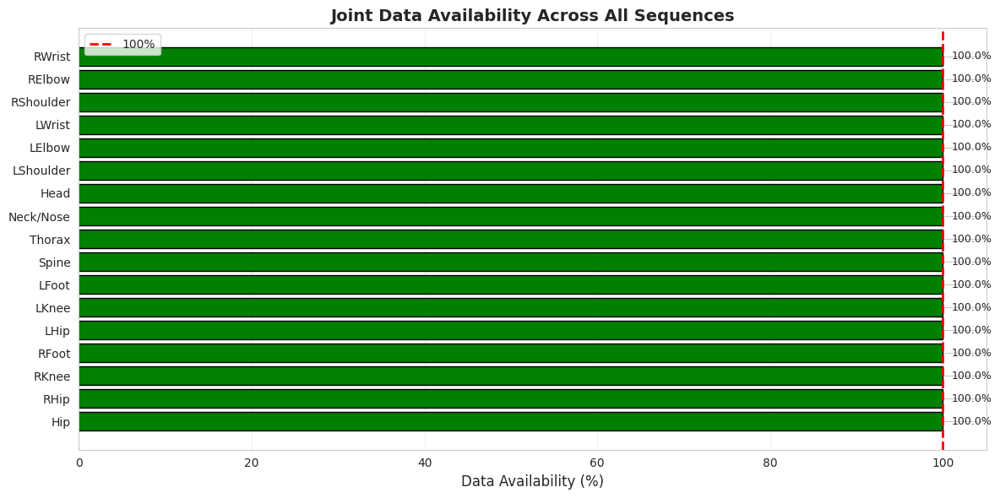

All active joints have 100.0% data availability


In [21]:
# Create heatmap showing data availability per joint
joint_availability = np.zeros(32)

for joint_idx in range(32):
    total_sequences = len(train_df)
    sequences_with_data = len(joint_stats[joint_idx]['min'])
    joint_availability[joint_idx] = sequences_with_data / total_sequences * 100

# Plot for active joints only
active_availability = joint_availability[active_indices]
active_names = [h36m_joint_names[i] for i in active_indices]

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(range(len(active_names)), active_availability, color='green', edgecolor='black')
ax.set_yticks(range(len(active_names)))
ax.set_yticklabels(active_names)
ax.set_xlabel('Data Availability (%)', fontsize=12)
ax.set_title('Joint Data Availability Across All Sequences', fontsize=14, fontweight='bold')
ax.set_xlim([0, 105])
ax.axvline(x=100, color='red', linestyle='--', linewidth=2, label='100%')
ax.grid(axis='x', alpha=0.3)
ax.legend()

# Add percentage labels
for i, bar in enumerate(bars):
    width = bar.get_width()
    ax.text(width + 1, bar.get_y() + bar.get_height()/2, 
            f'{width:.1f}%', ha='left', va='center', fontsize=9)

plt.tight_layout()
plt.show()

print(f"All active joints have {active_availability.min():.1f}% data availability")

### Summary Stats

In [22]:
# Create quality summary table
quality_summary = {
    'Metric': [
        'Total Sequences',
        'Sequences with NaN/Inf',
        'Sequences with Temporal Issues',
        'Data Completeness',
        'Average Joint Availability',
        'Min Joint Availability'
    ],
    'Value': [
        len(train_df),
        len(nan_stats),
        len(temporal_issues),
        f"{((len(train_df) - len(nan_stats)) / len(train_df) * 100):.2f}%",
        f"{active_availability.mean():.2f}%",
        f"{active_availability.min():.2f}%"
    ]
}

quality_df = pd.DataFrame(quality_summary)

print("\n" + "="*60)
print("Data Quality Summary")
print("="*60)
print(quality_df.to_string(index=False))
print("="*60)


Data Quality Summary
                        Metric   Value
               Total Sequences     209
        Sequences with NaN/Inf       0
Sequences with Temporal Issues       0
             Data Completeness 100.00%
    Average Joint Availability 100.00%
        Min Joint Availability 100.00%


## Data Distribution Analysis

Analyze joint position ranges, velocity/acceleration statistics, and action duration distributions.

In [23]:
# Analyze position ranges for key joints
key_joints = {
    'Hip': 0,
    'Head': 15,
    'LWrist': 19,
    'RWrist': 27,
    'LFoot': 8,
    'RFoot': 3
}

position_ranges = {joint: {'x': [], 'y': [], 'z': []} for joint in key_joints.keys()}

for subject in data_dict.keys():
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        
        for joint_name, joint_idx in key_joints.items():
            x_coords = sequence[:, joint_idx, 0]
            y_coords = sequence[:, joint_idx, 1]
            z_coords = sequence[:, joint_idx, 2]
            
            position_ranges[joint_name]['x'].extend(x_coords)
            position_ranges[joint_name]['y'].extend(y_coords)
            position_ranges[joint_name]['z'].extend(z_coords)

print("Position Range Statistics for Key Joints (mm)")
print("="*80)
print(f"{'Joint':<12} {'Axis':<6} {'Min':<12} {'Max':<12} {'Range':<12} {'Mean':<12} {'Std'}")
print("="*80)

for joint_name in key_joints.keys():
    for axis in ['x', 'y', 'z']:
        data = np.array(position_ranges[joint_name][axis])
        print(f"{joint_name:<12} {axis.upper():<6} {data.min():<12.1f} {data.max():<12.1f} "
              f"{data.max()-data.min():<12.1f} {data.mean():<12.1f} {data.std():<10.1f}")
    print("-"*80)

print("="*80)

Position Range Statistics for Key Joints (mm)
Joint        Axis   Min          Max          Range        Mean         Std
Hip          X      -1.4         1.8          3.2          0.1          0.4       
Hip          Y      -1.8         2.4          4.1          0.3          0.6       
Hip          Z      0.1          1.2          1.2          0.8          0.2       
--------------------------------------------------------------------------------
Head         X      -1.2         1.8          3.0          0.0          0.4       
Head         Y      -1.8         2.4          4.2          0.2          0.7       
Head         Z      0.0          1.8          1.8          1.4          0.3       
--------------------------------------------------------------------------------
LWrist       X      -1.2         1.7          2.9          0.2          0.4       
LWrist       Y      -1.8         2.4          4.1          0.2          0.6       
LWrist       Z      -0.0         2.0          2.0   

### Box Plots: Position Ranges for Key Joints

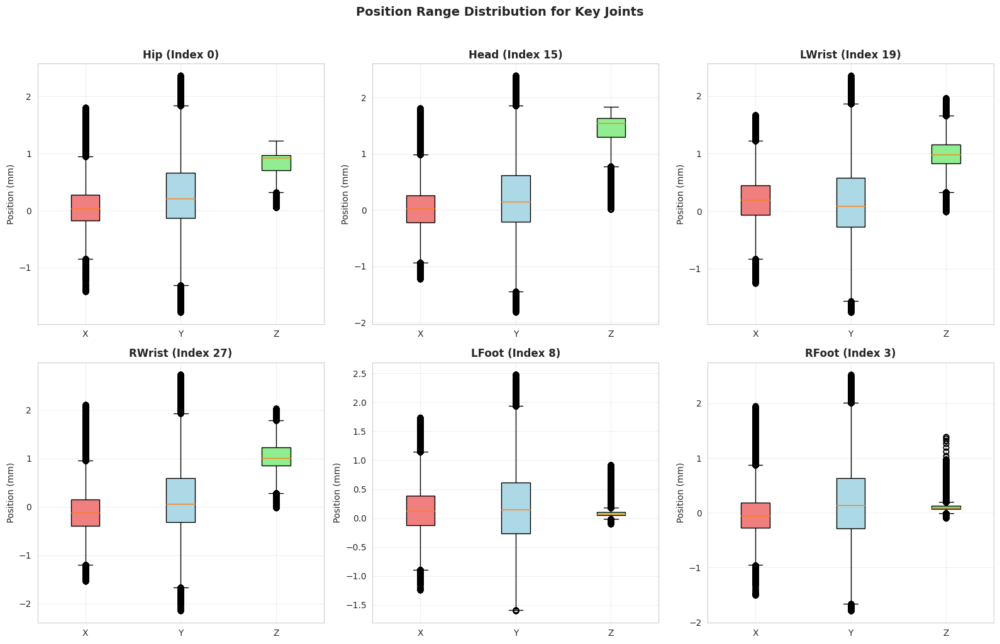

In [24]:
# Create box plots for position ranges
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for idx, (joint_name, joint_idx) in enumerate(key_joints.items()):
    ax = axes[idx]
    
    data_to_plot = [
        position_ranges[joint_name]['x'],
        position_ranges[joint_name]['y'],
        position_ranges[joint_name]['z']
    ]
    
    bp = ax.boxplot(data_to_plot, labels=['X', 'Y', 'Z'], patch_artist=True)
    
    # Color the boxes
    colors = ['lightcoral', 'lightblue', 'lightgreen']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
    
    ax.set_title(f'{joint_name} (Index {joint_idx})', fontsize=12, fontweight='bold')
    ax.set_ylabel('Position (mm)', fontsize=10)
    ax.grid(alpha=0.3)

plt.suptitle('Position Range Distribution for Key Joints', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### Velocity Statistics Analysis

In [25]:
# Calculate velocities for all sequences
velocity_stats = {joint: [] for joint in key_joints.keys()}

for subject in data_dict.keys():
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        
        # Calculate velocity (displacement per frame)
        velocities = np.diff(sequence, axis=0)  # Frame-to-frame difference
        
        for joint_name, joint_idx in key_joints.items():
            joint_velocities = velocities[:, joint_idx, :]
            # Calculate speed (magnitude of velocity vector)
            speeds = np.linalg.norm(joint_velocities, axis=1)
            velocity_stats[joint_name].extend(speeds)

# Convert to arrays
for joint in velocity_stats:
    velocity_stats[joint] = np.array(velocity_stats[joint])

print("Velocity Statistics for Key Joints (mm/frame)")
print("="*70)
print(f"{'Joint':<12} {'Mean':<12} {'Median':<12} {'Std':<12} {'Max':<12} {'95th %'}")
print("="*70)

for joint_name in key_joints.keys():
    data = velocity_stats[joint_name]
    print(f"{joint_name:<12} {data.mean():<12.1f} {np.median(data):<12.1f} "
          f"{data.std():<12.1f} {data.max():<12.1f} {np.percentile(data, 95):<10.1f}")

print("="*70)
print(f"\nNote: Frame rate = 50 Hz, so multiply by 50 to get mm/second")

Velocity Statistics for Key Joints (mm/frame)
Joint        Mean         Median       Std          Max          95th %
Hip          0.0          0.0          0.0          0.1          0.0       
Head         0.0          0.0          0.0          0.1          0.0       
LWrist       0.0          0.0          0.0          0.2          0.0       
RWrist       0.0          0.0          0.0          0.1          0.0       
LFoot        0.0          0.0          0.0          0.3          0.0       
RFoot        0.0          0.0          0.0          0.3          0.0       

Note: Frame rate = 50 Hz, so multiply by 50 to get mm/second


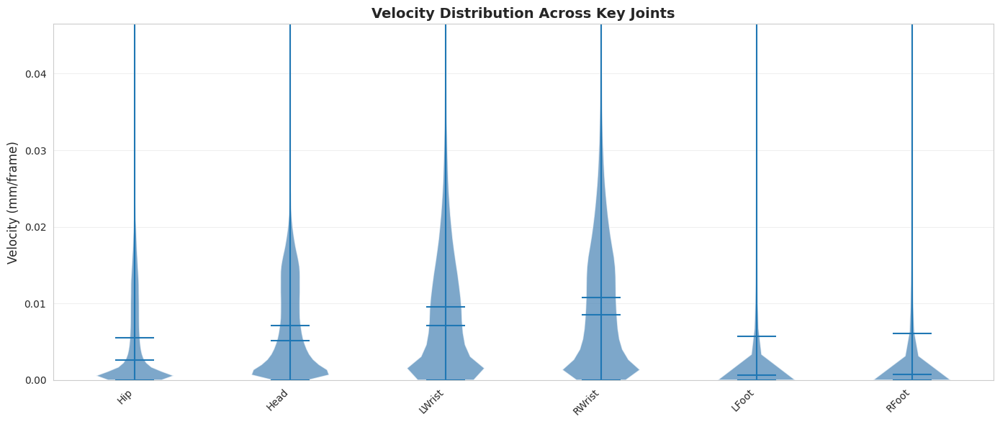

Violin plot shows the distribution density of velocities
Red line = median, Blue line = mean


In [26]:
# Create violin plots for velocity distributions
fig, ax = plt.subplots(figsize=(14, 6))

# Prepare data for violin plot
velocity_data = [velocity_stats[joint] for joint in key_joints.keys()]
positions = range(1, len(key_joints) + 1)

parts = ax.violinplot(velocity_data, positions=positions, showmeans=True, showmedians=True)

# Customize violin colors
for pc in parts['bodies']:
    pc.set_facecolor('steelblue')
    pc.set_alpha(0.7)

ax.set_xticks(positions)
ax.set_xticklabels(key_joints.keys(), rotation=45, ha='right')
ax.set_ylabel('Velocity (mm/frame)', fontsize=12)
ax.set_title('Velocity Distribution Across Key Joints', fontsize=14, fontweight='bold')
ax.grid(alpha=0.3, axis='y')
ax.set_ylim([0, np.percentile(np.concatenate(velocity_data), 99)])

plt.tight_layout()
plt.show()

print("Violin plot shows the distribution density of velocities")
print("Red line = median, Blue line = mean")

### Action Duration

In [27]:
# Analyze action duration distribution
action_durations = train_df.groupby('base_action')['num_frames'].agg(['mean', 'std', 'min', 'max'])
action_durations['mean_seconds'] = action_durations['mean'] / 50
action_durations['std_seconds'] = action_durations['std'] / 50

# Sort by mean duration
action_durations = action_durations.sort_values('mean', ascending=False)

print("Action Duration Statistics")
print("="*80)
print(f"{'Action':<20} {'Mean (frames)':<15} {'Mean (sec)':<12} {'Std (frames)':<15} {'Range'}")
print("="*80)

for action, row in action_durations.iterrows():
    print(f"{action:<20} {row['mean']:<15.0f} {row['mean_seconds']:<12.1f} "
          f"{row['std']:<15.0f} {row['min']:.0f}-{row['max']:.0f}")

print("="*80)

Action Duration Statistics
Action               Mean (frames)   Mean (sec)   Std (frames)    Range
Discussion           3983            79.7         1634            1931-6090
Smoking              3372            67.4         803             2410-4870
Phoning              3070            61.4         690             2085-4354
SittingDown          2903            58.1         1550            1501-6343
Walking              2893            57.9         812             1612-3737
Sitting              2799            56.0         864             1817-4533
Waiting              2735            54.7         1238            1440-4856
Eating               2656            53.1         485             2010-3763
Directions           2449            49.0         920             1383-4973
WalkTogether         2027            40.5         641             1231-3016
WalkDog              1924            38.5         438             1187-2732
Photo                1882            37.6         622            

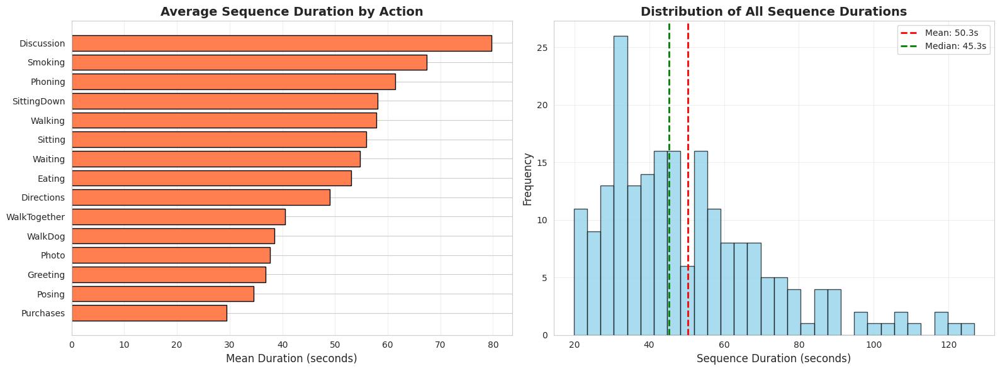

In [28]:
# Visualize action durations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Left: Mean duration by action
action_durations_sorted = action_durations.sort_values('mean_seconds', ascending=True)
ax1.barh(range(len(action_durations_sorted)), action_durations_sorted['mean_seconds'], 
         color='coral', edgecolor='black')
ax1.set_yticks(range(len(action_durations_sorted)))
ax1.set_yticklabels(action_durations_sorted.index)
ax1.set_xlabel('Mean Duration (seconds)', fontsize=12)
ax1.set_title('Average Sequence Duration by Action', fontsize=14, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# Right: Distribution of all sequence durations
ax2.hist(train_df['num_frames'] / 50, bins=30, color='skyblue', edgecolor='black', alpha=0.7)
ax2.axvline(train_df['num_frames'].mean() / 50, color='red', linestyle='--', 
            linewidth=2, label=f'Mean: {train_df["num_frames"].mean()/50:.1f}s')
ax2.axvline(train_df['num_frames'].median() / 50, color='green', linestyle='--', 
            linewidth=2, label=f'Median: {train_df["num_frames"].median()/50:.1f}s')
ax2.set_xlabel('Sequence Duration (seconds)', fontsize=12)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Distribution of All Sequence Durations', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

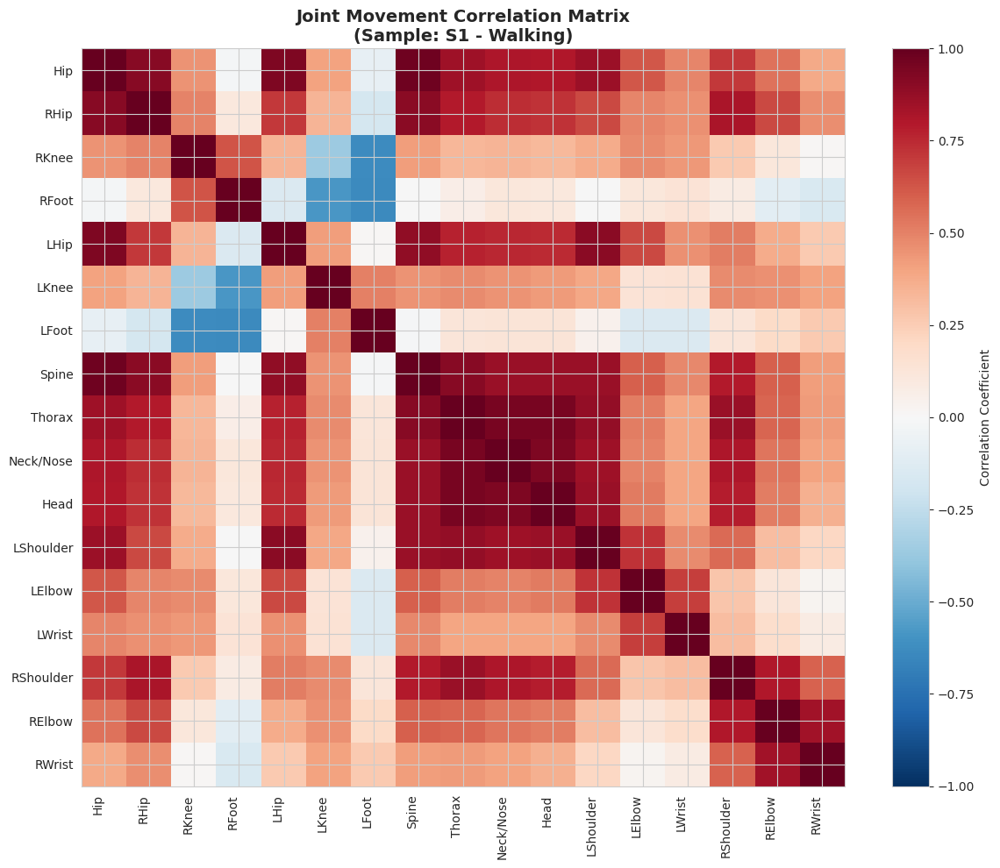

Correlation Matrix Legend:
  Red = Negative correlation (joints move in opposite patterns)
  White = No correlation
  Blue = Positive correlation (joints move together)


In [29]:
# Calculate correlation between joint movements
# Use a sample sequence for demonstration
sample_subject = 'S1'
sample_action = 'Walking'
sample_seq = data_dict[sample_subject][sample_action]

# Calculate velocities
velocities = np.diff(sample_seq, axis=0)
# Get speed (magnitude) for each joint
joint_speeds = np.linalg.norm(velocities, axis=2)  # Shape: (frames-1, 32)

# Calculate correlation matrix for active joints only
active_indices = [i for i, name in enumerate(h36m_joint_names) if name != '']
active_speeds = joint_speeds[:, active_indices]
correlation_matrix = np.corrcoef(active_speeds.T)

# Plot correlation heatmap
fig, ax = plt.subplots(figsize=(12, 10))
im = ax.imshow(correlation_matrix, cmap='RdBu_r', aspect='auto', vmin=-1, vmax=1)

active_names = [h36m_joint_names[i] for i in active_indices]
ax.set_xticks(range(len(active_names)))
ax.set_yticks(range(len(active_names)))
ax.set_xticklabels(active_names, rotation=90, ha='right')
ax.set_yticklabels(active_names)

ax.set_title(f'Joint Movement Correlation Matrix\n(Sample: {sample_subject} - {sample_action})', 
             fontsize=14, fontweight='bold')

plt.colorbar(im, ax=ax, label='Correlation Coefficient')
plt.tight_layout()
plt.show()

print("Correlation Matrix Legend:")
print("  Red = Negative correlation (joints move in opposite patterns)")
print("  White = No correlation")
print("  Blue = Positive correlation (joints move together)")

## Outlier Detection

Identify sequences with extreme positions, sudden trajectory jumps, or anomalous motion patterns.

In [30]:
# Define anatomical bounds for joint positions (relative to hip)
# Based on typical human body proportions
anatomical_bounds = {
    'max_limb_length': 1500,  # mm (maximum distance from hip)
    'max_height': 2000,       # mm (maximum y-coordinate)
    'min_height': -500,       # mm (minimum y-coordinate for feet)
    'max_horizontal': 1000    # mm (maximum x or z from center)
}

extreme_position_outliers = []

for subject in data_dict.keys():
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        
        # Check for extreme positions relative to hip (joint 0)
        hip_positions = sequence[:, 0, :]  # Hip positions over time
        
        for joint_idx in range(32):
            if h36m_joint_names[joint_idx] == '':
                continue
                
            joint_positions = sequence[:, joint_idx, :]
            
            # Calculate distances from hip
            distances = np.linalg.norm(joint_positions - hip_positions, axis=1)
            
            # Check for extreme values
            max_distance = distances.max()
            if max_distance > anatomical_bounds['max_limb_length']:
                extreme_position_outliers.append({
                    'subject': subject,
                    'action': action,
                    'joint': h36m_joint_names[joint_idx],
                    'joint_idx': joint_idx,
                    'max_distance': max_distance,
                    'type': 'extreme_position'
                })

print("="*60)
print("Extreme Position Detection")
print("="*60)
print(f"Anatomical bound: {anatomical_bounds['max_limb_length']} mm from hip")

if len(extreme_position_outliers) == 0:
    print("\n✓ No extreme positions detected!")
else:
    print(f"\n✗ Found {len(extreme_position_outliers)} extreme positions:")
    for outlier in extreme_position_outliers[:10]:
        print(f"  {outlier['subject']}_{outlier['action']}, {outlier['joint']}: "
              f"{outlier['max_distance']:.1f} mm from hip")

print("="*60)

Extreme Position Detection
Anatomical bound: 1500 mm from hip

✓ No extreme positions detected!


In [31]:
# Detect sudden acceleration (second derivative)
acceleration_threshold = 500  # mm/frame^2
sudden_jump_outliers = []

for subject in data_dict.keys():
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        
        if sequence.shape[0] < 3:  # Need at least 3 frames for acceleration
            continue
        
        # Calculate velocity and acceleration
        velocities = np.diff(sequence, axis=0)
        accelerations = np.diff(velocities, axis=0)
        
        # Calculate acceleration magnitude for each joint
        accel_magnitudes = np.linalg.norm(accelerations, axis=2)  # (frames-2, 32)
        
        max_accel = accel_magnitudes.max()
        if max_accel > acceleration_threshold:
            # Find which joint and frame
            frame_idx, joint_idx = np.unravel_index(accel_magnitudes.argmax(), accel_magnitudes.shape)
            
            if h36m_joint_names[joint_idx] != '':
                sudden_jump_outliers.append({
                    'subject': subject,
                    'action': action,
                    'joint': h36m_joint_names[joint_idx],
                    'joint_idx': joint_idx,
                    'frame': frame_idx,
                    'acceleration': max_accel,
                    'type': 'sudden_jump'
                })

print("="*60)
print("Sudden Trajectory Jump Detection")
print("="*60)
print(f"Acceleration threshold: {acceleration_threshold} mm/frame²")

if len(sudden_jump_outliers) == 0:
    print("\n✓ No sudden jumps detected!")
else:
    print(f"\n✗ Found {len(sudden_jump_outliers)} sequences with sudden jumps:")
    for outlier in sudden_jump_outliers[:10]:
        print(f"  {outlier['subject']}_{outlier['action']}, {outlier['joint']} at frame {outlier['frame']}: "
              f"{outlier['acceleration']:.1f} mm/frame²")

print("="*60)

Sudden Trajectory Jump Detection
Acceleration threshold: 500 mm/frame²

✓ No sudden jumps detected!


In [32]:
# Detect sequences with unusually low motion variance
variance_threshold = 100  # mm² (variance of positions)
static_sequence_outliers = []

for subject in data_dict.keys():
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        
        # Calculate variance across all joints and coordinates
        total_variance = np.var(sequence)
        
        # Also check per-joint variance
        joint_variances = np.var(sequence, axis=(0, 2))  # Variance per joint across frames and xyz
        min_joint_variance = joint_variances.min()
        
        if total_variance < variance_threshold:
            static_sequence_outliers.append({
                'subject': subject,
                'action': action,
                'total_variance': total_variance,
                'min_joint_variance': min_joint_variance,
                'type': 'static_sequence'
            })

print("="*60)
print("Static Sequence Detection (Low Variance)")
print("="*60)
print(f"Variance threshold: {variance_threshold} mm²")

if len(static_sequence_outliers) == 0:
    print("\n✓ No static sequences detected!")
else:
    print(f"\n✗ Found {len(static_sequence_outliers)} static sequences:")
    for outlier in static_sequence_outliers[:10]:
        print(f"  {outlier['subject']}_{outlier['action']}: "
              f"variance = {outlier['total_variance']:.1f} mm²")

print("="*60)

Static Sequence Detection (Low Variance)
Variance threshold: 100 mm²

✗ Found 209 static sequences:
  S1_Directions 1: variance = 0.4 mm²
  S1_Directions: variance = 0.4 mm²
  S1_Discussion 1: variance = 0.5 mm²
  S1_Discussion: variance = 0.4 mm²
  S1_Eating 2: variance = 0.3 mm²
  S1_Eating: variance = 0.3 mm²
  S1_Greeting 1: variance = 0.4 mm²
  S1_Greeting: variance = 0.4 mm²
  S1_Phoning 1: variance = 0.4 mm²
  S1_Phoning: variance = 0.3 mm²


In [33]:
# Create summary of all outlier types
# Compute unique sequences affected across all outlier lists to avoid nested/complex expressions
unique_seq_set = {f"{o['subject']}_{o['action']}" for o in (extreme_position_outliers + sudden_jump_outliers + static_sequence_outliers)}
unique_seq_count = len(unique_seq_set)

outlier_summary = {
    'Outlier Type': [
        'Extreme Positions',
        'Sudden Jumps',
        'Static Sequences',
        'Total Unique Sequences with Issues'
    ],
    'Count': [
        len(extreme_position_outliers),
        len(sudden_jump_outliers),
        len(static_sequence_outliers),
        unique_seq_count
    ],
    'Percentage of Total': [
        f"{len(extreme_position_outliers) / len(train_df) * 100:.2f}%",
        f"{len(sudden_jump_outliers) / len(train_df) * 100:.2f}%",
        f"{len(static_sequence_outliers) / len(train_df) * 100:.2f}%",
        f"{unique_seq_count / len(train_df) * 100:.2f}%"
    ]
}

outlier_summary_df = pd.DataFrame(outlier_summary)

print("\n" + "="*70)
print("Outlier Detection Summary")
print("="*70)
print(outlier_summary_df.to_string(index=False))
print("="*70)
print(f"\nTotal sequences analyzed: {len(train_df)}")


Outlier Detection Summary
                      Outlier Type  Count Percentage of Total
                 Extreme Positions      0               0.00%
                      Sudden Jumps      0               0.00%
                  Static Sequences    209             100.00%
Total Unique Sequences with Issues    209             100.00%

Total sequences analyzed: 209


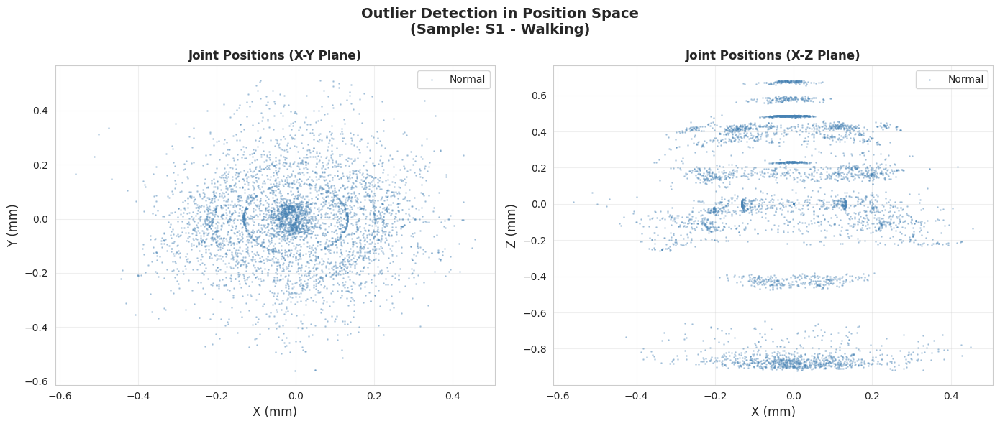

Sampled 5000 positions from sequence
Outliers detected: 0 (0.00%)


In [34]:
# Visualize outliers in position space
# Use a sample sequence with potential outliers
sample_subject = 'S1'
sample_action = 'Walking'
sample_seq = data_dict[sample_subject][sample_action]

# Get hip-relative positions for all joints
hip_pos = sample_seq[:, 0, :]
relative_positions = sample_seq - hip_pos[:, np.newaxis, :]

# Flatten for scatter plot
all_positions = relative_positions.reshape(-1, 3)

# Sample for visualization (too many points otherwise)
sample_indices = np.random.choice(len(all_positions), size=min(5000, len(all_positions)), replace=False)
sampled_positions = all_positions[sample_indices]

# Calculate distances
distances = np.linalg.norm(sampled_positions, axis=1)
outlier_mask = distances > anatomical_bounds['max_limb_length']

# Create 3D scatter plot
fig = plt.figure(figsize=(14, 6))

# 2D projections
ax1 = fig.add_subplot(121)
ax1.scatter(sampled_positions[~outlier_mask, 0], sampled_positions[~outlier_mask, 1], 
           c='steelblue', alpha=0.3, s=1, label='Normal')
if outlier_mask.any():
    ax1.scatter(sampled_positions[outlier_mask, 0], sampled_positions[outlier_mask, 1], 
               c='red', alpha=0.8, s=20, label='Outliers')
ax1.set_xlabel('X (mm)', fontsize=12)
ax1.set_ylabel('Y (mm)', fontsize=12)
ax1.set_title('Joint Positions (X-Y Plane)', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(alpha=0.3)

ax2 = fig.add_subplot(122)
ax2.scatter(sampled_positions[~outlier_mask, 0], sampled_positions[~outlier_mask, 2], 
           c='steelblue', alpha=0.3, s=1, label='Normal')
if outlier_mask.any():
    ax2.scatter(sampled_positions[outlier_mask, 0], sampled_positions[outlier_mask, 2], 
               c='red', alpha=0.8, s=20, label='Outliers')
ax2.set_xlabel('X (mm)', fontsize=12)
ax2.set_ylabel('Z (mm)', fontsize=12)
ax2.set_title('Joint Positions (X-Z Plane)', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

plt.suptitle(f'Outlier Detection in Position Space\n(Sample: {sample_subject} - {sample_action})', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Sampled {len(sampled_positions)} positions from sequence")
print(f"Outliers detected: {outlier_mask.sum()} ({outlier_mask.sum()/len(sampled_positions)*100:.2f}%)")

### Time Series: Flagged Sequences with Anomalies

In [35]:
# Plot velocity time series with anomaly detection
if len(sudden_jump_outliers) > 0:
    # Pick first sequence with sudden jump
    outlier = sudden_jump_outliers[0]
    sequence = data_dict[outlier['subject']][outlier['action']]
    
    # Calculate velocities for the problematic joint
    joint_positions = sequence[:, outlier['joint_idx'], :]
    velocities = np.diff(joint_positions, axis=0)
    speeds = np.linalg.norm(velocities, axis=1)
    
    # Calculate accelerations
    accelerations = np.diff(velocities, axis=0)
    accel_magnitudes = np.linalg.norm(accelerations, axis=1)
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8))
    
    # Velocity plot
    ax1.plot(speeds, linewidth=1.5, color='steelblue')
    ax1.axvline(x=outlier['frame'], color='red', linestyle='--', linewidth=2, 
                label=f"Anomaly at frame {outlier['frame']}")
    ax1.set_xlabel('Frame', fontsize=12)
    ax1.set_ylabel('Velocity (mm/frame)', fontsize=12)
    ax1.set_title(f"Velocity Time Series: {outlier['subject']}_{outlier['action']}, {outlier['joint']}", 
                  fontsize=12, fontweight='bold')
    ax1.legend()
    ax1.grid(alpha=0.3)
    
    # Acceleration plot
    ax2.plot(accel_magnitudes, linewidth=1.5, color='coral')
    ax2.axvline(x=outlier['frame'], color='red', linestyle='--', linewidth=2, 
                label=f"Jump: {outlier['acceleration']:.1f} mm/frame²")
    ax2.axhline(y=acceleration_threshold, color='orange', linestyle=':', linewidth=2, 
                label=f'Threshold: {acceleration_threshold}')
    ax2.set_xlabel('Frame', fontsize=12)
    ax2.set_ylabel('Acceleration (mm/frame²)', fontsize=12)
    ax2.set_title('Acceleration Magnitude', fontsize=12, fontweight='bold')
    ax2.legend()
    ax2.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
else:
    print("No sudden jump outliers found to visualize")

No sudden jump outliers found to visualize


## Sample Visualizations

Visualize 3D skeleton structure, motion trajectories, and animated sequences for qualitative analysis.

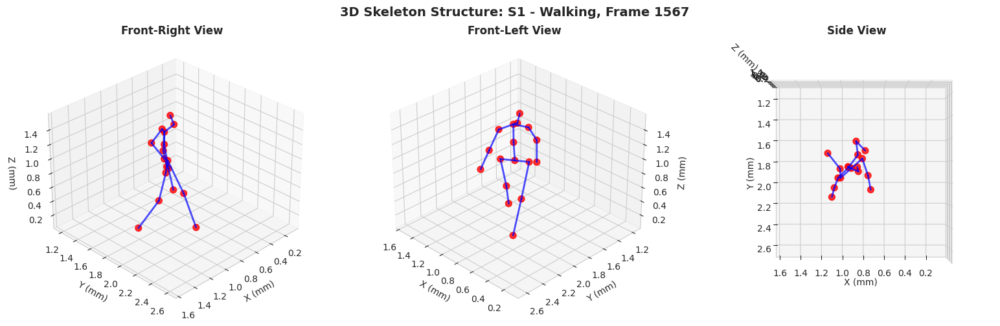

In [36]:
from mpl_toolkits.mplot3d import Axes3D

# Select a sample frame from a sequence
sample_subject = 'S1'
sample_action = 'Walking'
sample_sequence = data_dict[sample_subject][sample_action]
frame_idx = len(sample_sequence) // 2  # Middle frame

# Extract joint positions for this frame
frame_positions = sample_sequence[frame_idx]

# Get active joints only
active_indices = [i for i, name in enumerate(h36m_joint_names) if name != '']
active_positions = frame_positions[active_indices]

# Create 3D plot with multiple viewpoints
fig = plt.figure(figsize=(16, 5))

viewpoints = [
    (30, 45, 'Front-Right View'),
    (30, 135, 'Front-Left View'),
    (90, 90, 'Side View')
]

for idx, (elev, azim, title) in enumerate(viewpoints, 1):
    ax = fig.add_subplot(1, 3, idx, projection='3d')
    
    # Plot joints as scatter points
    ax.scatter(frame_positions[active_indices, 0], 
               frame_positions[active_indices, 1], 
               frame_positions[active_indices, 2],
               c='red', s=50, alpha=0.8)
    
    # Plot skeleton connections
    for parent, child in h36m_skeleton_connections:
        if parent in active_indices and child in active_indices:
            points = np.array([frame_positions[parent], frame_positions[child]])
            ax.plot(points[:, 0], points[:, 1], points[:, 2], 
                   'b-', linewidth=2, alpha=0.7)
    
    # Set labels and view
    ax.set_xlabel('X (mm)', fontsize=10)
    ax.set_ylabel('Y (mm)', fontsize=10)
    ax.set_zlabel('Z (mm)', fontsize=10)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.view_init(elev=elev, azim=azim)
    
    # Equal aspect ratio
    max_range = np.array([
        frame_positions[:, 0].max() - frame_positions[:, 0].min(),
        frame_positions[:, 1].max() - frame_positions[:, 1].min(),
        frame_positions[:, 2].max() - frame_positions[:, 2].min()
    ]).max() / 2.0
    
    mid_x = (frame_positions[:, 0].max() + frame_positions[:, 0].min()) * 0.5
    mid_y = (frame_positions[:, 1].max() + frame_positions[:, 1].min()) * 0.5
    mid_z = (frame_positions[:, 2].max() + frame_positions[:, 2].min()) * 0.5
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)

plt.suptitle(f'3D Skeleton Structure: {sample_subject} - {sample_action}, Frame {frame_idx}',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

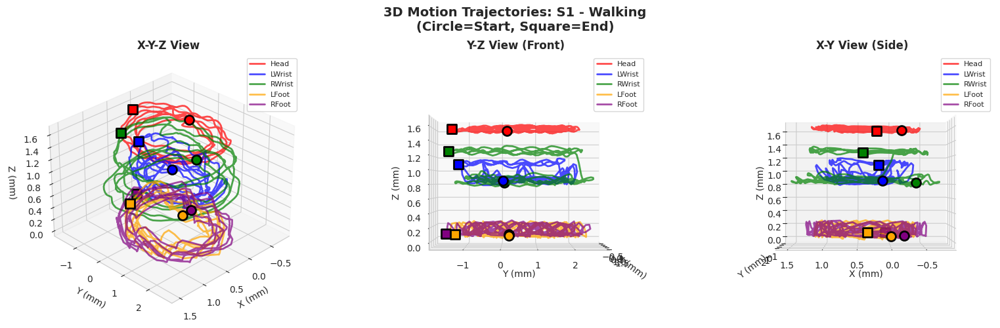

Showing 627 frames (every 5th frame)


In [37]:
# Visualize trajectories of key joints over time
trajectory_joints = {
    'Head': 15,
    'LWrist': 19,
    'RWrist': 27,
    'LFoot': 8,
    'RFoot': 3
}

# Use every Nth frame to avoid clutter
skip_frames = 5
trajectory_sequence = sample_sequence[::skip_frames]

fig = plt.figure(figsize=(16, 5))

# Create 3 views
views = [
    (30, 45, 'X-Y-Z View'),
    (0, 0, 'Y-Z View (Front)'),
    (0, 90, 'X-Y View (Side)')
]

for idx, (elev, azim, view_title) in enumerate(views, 1):
    ax = fig.add_subplot(1, 3, idx, projection='3d')
    
    # Plot trajectory for each joint
    colors = ['red', 'blue', 'green', 'orange', 'purple']
    for (joint_name, joint_idx), color in zip(trajectory_joints.items(), colors):
        positions = trajectory_sequence[:, joint_idx, :]
        ax.plot(positions[:, 0], positions[:, 1], positions[:, 2],
               label=joint_name, color=color, linewidth=2, alpha=0.7)
        
        # Mark start and end points
        ax.scatter(positions[0, 0], positions[0, 1], positions[0, 2],
                  color=color, s=100, marker='o', edgecolors='black', linewidths=2)
        ax.scatter(positions[-1, 0], positions[-1, 1], positions[-1, 2],
                  color=color, s=100, marker='s', edgecolors='black', linewidths=2)
    
    ax.set_xlabel('X (mm)', fontsize=10)
    ax.set_ylabel('Y (mm)', fontsize=10)
    ax.set_zlabel('Z (mm)', fontsize=10)
    ax.set_title(view_title, fontsize=12, fontweight='bold')
    ax.view_init(elev=elev, azim=azim)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

plt.suptitle(f'3D Motion Trajectories: {sample_subject} - {sample_action}\n(Circle=Start, Square=End)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Showing {len(trajectory_sequence)} frames (every {skip_frames}th frame)")

###  Prepare Animation Data for Multiple Actions

In [38]:
# Select 3-4 different actions for animation
animation_actions = ['Walking', 'Sitting', 'Eating', 'Discussion']
animation_data = {}

for action in animation_actions:
    if action in data_dict['S1']:
        seq = data_dict['S1'][action]
        # Downsample to ~60 frames for reasonable animation
        step = max(1, len(seq) // 60)
        animation_data[action] = seq[::step][:60]
        print(f"{action}: {len(animation_data[action])} frames")

Walking: 60 frames
Eating: 60 frames
Discussion: 60 frames


In [39]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Function to create skeleton animation
def create_skeleton_animation(sequence, title, interval=50):
    """
    Create animated skeleton visualization
    interval: delay between frames in milliseconds
    """
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Initialize plot elements
    joints_scatter = ax.scatter([], [], [], c='red', s=50, alpha=0.8)
    bones_lines = [ax.plot([], [], [], 'b-', linewidth=2, alpha=0.7)[0] 
                   for _ in h36m_skeleton_connections]
    
    # Set fixed axes limits
    all_positions = sequence.reshape(-1, 3)
    max_range = np.array([
        all_positions[:, 0].max() - all_positions[:, 0].min(),
        all_positions[:, 1].max() - all_positions[:, 1].min(),
        all_positions[:, 2].max() - all_positions[:, 2].min()
    ]).max() / 2.0
    
    mid_x = (all_positions[:, 0].max() + all_positions[:, 0].min()) * 0.5
    mid_y = (all_positions[:, 1].max() + all_positions[:, 1].min()) * 0.5
    mid_z = (all_positions[:, 2].max() + all_positions[:, 2].min()) * 0.5
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    ax.set_xlabel('X (mm)', fontsize=12)
    ax.set_ylabel('Y (mm)', fontsize=12)
    ax.set_zlabel('Z (mm)', fontsize=12)
    ax.view_init(elev=20, azim=45)
    
    frame_text = ax.text2D(0.05, 0.95, '', transform=ax.transAxes, fontsize=12)
    
    def init():
        joints_scatter._offsets3d = ([], [], [])
        for line in bones_lines:
            line.set_data(np.array([]), np.array([]))
            line.set_3d_properties(np.array([]))
        frame_text.set_text('')
        return [joints_scatter] + bones_lines + [frame_text]
    
    def update(frame_idx):
        # Update joints
        positions = sequence[frame_idx]
        joints_scatter._offsets3d = (positions[:, 0], positions[:, 1], positions[:, 2])
        
        # Update bones
        for line_idx, (parent, child) in enumerate(h36m_skeleton_connections):
            points = np.array([positions[parent], positions[child]])
            bones_lines[line_idx].set_data(points[:, 0], points[:, 1])
            bones_lines[line_idx].set_3d_properties(points[:, 2])
        
        frame_text.set_text(f'Frame: {frame_idx}/{len(sequence)-1}')
        ax.set_title(f'{title}\nFrame {frame_idx}/{len(sequence)-1}', 
                    fontsize=14, fontweight='bold')
        
        return [joints_scatter] + bones_lines + [frame_text]
    
    anim = FuncAnimation(fig, update, frames=len(sequence), init_func=init,
                        interval=interval, blit=False, repeat=True)
    
    plt.close()
    return anim

# Create animation for first action
if len(animation_data) > 0:
    first_action = list(animation_data.keys())[0]
    print(f"Creating animation for: {first_action}")
    print("Note: Animation generation may take a moment...")
    anim = create_skeleton_animation(animation_data[first_action], 
                                     f'S1 - {first_action}', interval=50)
    display(HTML(anim.to_jshtml()))
else:
    print("No animation data available")

Creating animation for: Walking
Note: Animation generation may take a moment...


In [40]:
import os
from pathlib import Path

# Create output directory
output_dir = Path('../data/visualizations')
output_dir.mkdir(exist_ok=True, parents=True)

# Save animations for each action
saved_files = []

for action_name, sequence in animation_data.items():
    print(f"Generating animation for {action_name}...")
    
    anim = create_skeleton_animation(sequence, f'S1 - {action_name}', interval=50)
    
    # Save as GIF
    output_file = output_dir / f'h36m_{action_name.lower()}_animation.gif'
    anim.save(str(output_file), writer='pillow', fps=20)
    saved_files.append(output_file)
    
    print(f"  ✓ Saved: {output_file}")
    plt.close('all')

print(f"\n{'='*60}")
print(f"Animation Summary")
print(f"{'='*60}")
print(f"Total animations created: {len(saved_files)}")
print(f"Output directory: {output_dir}")
print(f"{'='*60}")

for file in saved_files:
    print(f"  - {file.name} ({file.stat().st_size / 1024:.1f} KB)")

Generating animation for Walking...


  ✓ Saved: ../data/visualizations/h36m_walking_animation.gif
Generating animation for Eating...
  ✓ Saved: ../data/visualizations/h36m_eating_animation.gif
Generating animation for Discussion...
  ✓ Saved: ../data/visualizations/h36m_discussion_animation.gif

Animation Summary
Total animations created: 3
Output directory: ../data/visualizations
  - h36m_walking_animation.gif (816.2 KB)
  - h36m_eating_animation.gif (426.8 KB)
  - h36m_discussion_animation.gif (628.4 KB)


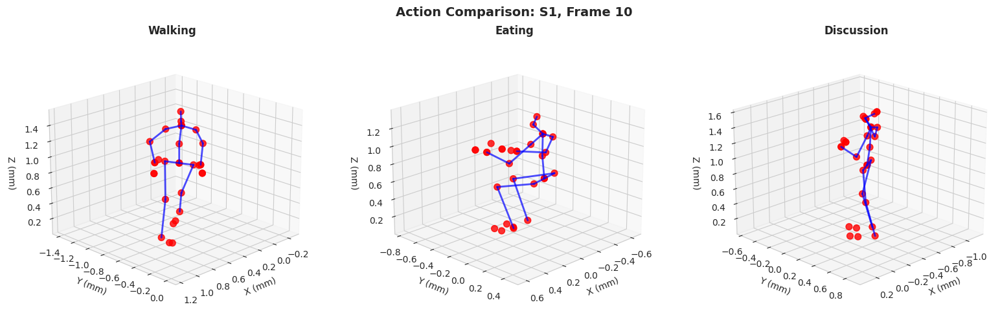

In [41]:
# Create side-by-side comparison of different actions (same frame index)
if len(animation_data) >= 3:
    fig = plt.figure(figsize=(16, 5))
    
    comparison_actions = list(animation_data.keys())[:3]
    frame_idx = 10  # Use frame 10 for comparison
    
    for idx, action in enumerate(comparison_actions, 1):
        ax = fig.add_subplot(1, 3, idx, projection='3d')
        
        positions = animation_data[action][frame_idx]
        
        # Plot joints
        ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2],
                  c='red', s=50, alpha=0.8)
        
        # Plot bones
        for parent, child in h36m_skeleton_connections:
            points = np.array([positions[parent], positions[child]])
            ax.plot(points[:, 0], points[:, 1], points[:, 2],
                   'b-', linewidth=2, alpha=0.7)
        
        # Set labels and view
        ax.set_xlabel('X (mm)', fontsize=10)
        ax.set_ylabel('Y (mm)', fontsize=10)
        ax.set_zlabel('Z (mm)', fontsize=10)
        ax.set_title(action, fontsize=12, fontweight='bold')
        ax.view_init(elev=20, azim=45)
        
        # Set scale based on actual data range (not fixed)
        max_range = np.array([
            positions[:, 0].max() - positions[:, 0].min(),
            positions[:, 1].max() - positions[:, 1].min(),
            positions[:, 2].max() - positions[:, 2].min()
        ]).max() / 2.0
        
        mid_x = (positions[:, 0].max() + positions[:, 0].min()) * 0.5
        mid_y = (positions[:, 1].max() + positions[:, 1].min()) * 0.5
        mid_z = (positions[:, 2].max() + positions[:, 2].min()) * 0.5
        
        ax.set_xlim(mid_x - max_range, mid_x + max_range)
        ax.set_ylim(mid_y - max_range, mid_y + max_range)
        ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    plt.suptitle(f'Action Comparison: S1, Frame {frame_idx}',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

## Duplicate & Redundancy Check

Identify exact duplicates and near-duplicate sequences using similarity metrics.

In [42]:
# Check for exact duplicate sequences
def get_sequence_hash(sequence):
    """Create hash for sequence comparison"""
    return hash(sequence.tobytes())

sequence_hashes = {}
exact_duplicates = []

for subject in data_dict.keys():
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        seq_hash = get_sequence_hash(sequence)
        seq_id = f"{subject}_{action}"
        
        if seq_hash in sequence_hashes:
            exact_duplicates.append({
                'sequence_1': sequence_hashes[seq_hash],
                'sequence_2': seq_id,
                'hash': seq_hash
            })
        else:
            sequence_hashes[seq_hash] = seq_id

print("="*60)
print("Exact Duplicate Detection")
print("="*60)
print(f"Total sequences checked: {len(train_df)}")
print(f"Unique hashes: {len(sequence_hashes)}")

if len(exact_duplicates) == 0:
    print("\n✓ No exact duplicates found!")
else:
    print(f"\n✗ Found {len(exact_duplicates)} exact duplicate pairs:")
    for dup in exact_duplicates[:5]:
        print(f"  {dup['sequence_1']} == {dup['sequence_2']}")

print("="*60)

Exact Duplicate Detection
Total sequences checked: 209
Unique hashes: 209

✓ No exact duplicates found!


In [43]:
# Detect near-duplicates using cosine similarity
from sklearn.metrics.pairwise import cosine_similarity

# Create feature vectors for each sequence (flatten and normalize)
sequence_features = []
sequence_ids = []

print("Extracting features for similarity comparison...")
for subject in sorted(data_dict.keys()):
    for action in data_dict[subject].keys():
        sequence = data_dict[subject][action]
        
        # Create feature vector: mean and std of each joint's positions
        features = []
        features.extend(sequence.mean(axis=0).flatten())  # Mean positions
        features.extend(sequence.std(axis=0).flatten())   # Std of positions
        
        sequence_features.append(features)
        sequence_ids.append(f"{subject}_{action}")

# Convert to array and compute similarity
sequence_features = np.array(sequence_features)
print(f"Feature matrix shape: {sequence_features.shape}")

# Sample similarity computation (full matrix would be large)
# Only compute for first 50 sequences to save time
sample_size = min(50, len(sequence_features))
sample_features = sequence_features[:sample_size]
sample_ids = sequence_ids[:sample_size]

similarity_matrix = cosine_similarity(sample_features)

# Find near-duplicates (similarity > 0.95, excluding self-similarity)
similarity_threshold = 0.95
near_duplicates = []

for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        if similarity_matrix[i, j] > similarity_threshold:
            near_duplicates.append({
                'sequence_1': sample_ids[i],
                'sequence_2': sample_ids[j],
                'similarity': similarity_matrix[i, j]
            })

print("\n" + "="*60)
print("Near-Duplicate Detection (Cosine Similarity)")
print("="*60)
print(f"Similarity threshold: {similarity_threshold}")
print(f"Sequences analyzed: {sample_size}")

if len(near_duplicates) == 0:
    print(f"\n✓ No near-duplicates found (similarity > {similarity_threshold})")
else:
    print(f"\n✗ Found {len(near_duplicates)} near-duplicate pairs:")
    for dup in near_duplicates[:5]:
        print(f"  {dup['sequence_1']} ≈ {dup['sequence_2']}: "
              f"similarity = {dup['similarity']:.4f}")

print("="*60)

Extracting features for similarity comparison...
Feature matrix shape: (209, 192)

Near-Duplicate Detection (Cosine Similarity)
Similarity threshold: 0.95
Sequences analyzed: 50

✗ Found 139 near-duplicate pairs:
  S1_Directions 1 ≈ S1_Directions: similarity = 0.9915
  S1_Directions 1 ≈ S1_Discussion 1: similarity = 0.9724
  S1_Directions 1 ≈ S1_Discussion: similarity = 0.9876
  S1_Directions 1 ≈ S1_Greeting 1: similarity = 0.9618
  S1_Directions 1 ≈ S1_Greeting: similarity = 0.9598


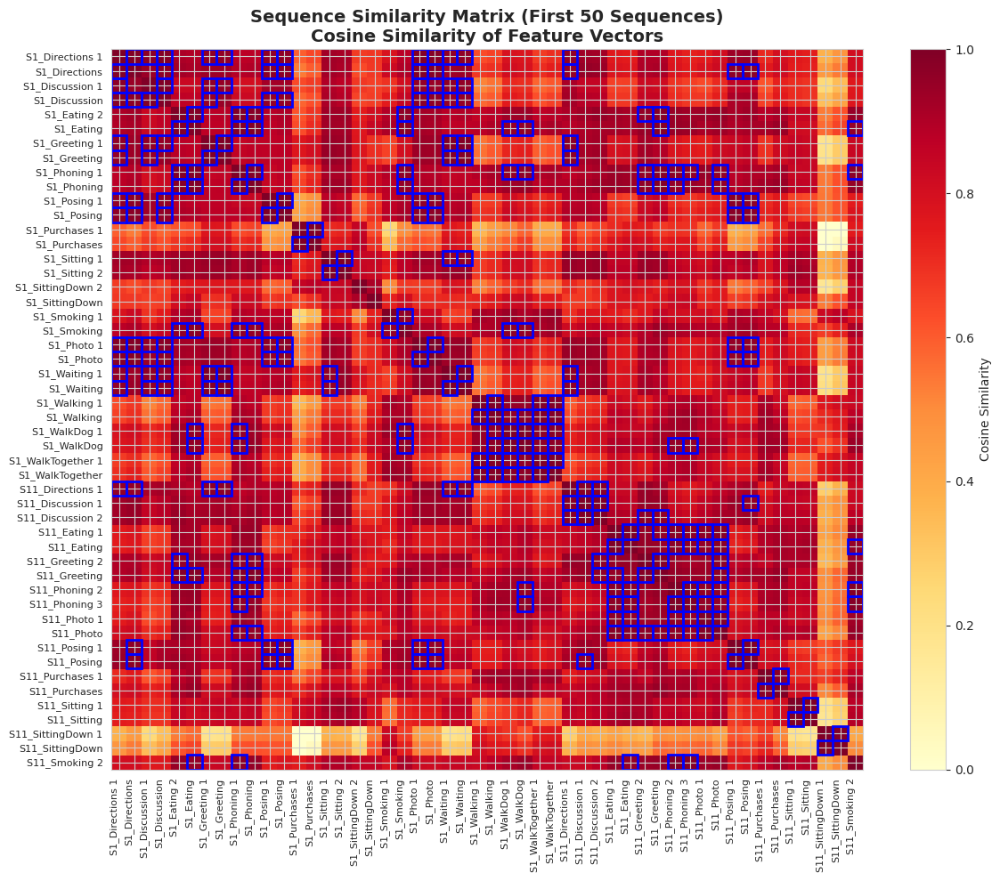

Blue boxes indicate near-duplicates (similarity > 0.95)


In [44]:
# Visualize similarity matrix
fig, ax = plt.subplots(figsize=(12, 10))

im = ax.imshow(similarity_matrix, cmap='YlOrRd', aspect='auto', vmin=0, vmax=1)

# Set ticks
ax.set_xticks(range(len(sample_ids)))
ax.set_yticks(range(len(sample_ids)))
ax.set_xticklabels(sample_ids, rotation=90, ha='right', fontsize=8)
ax.set_yticklabels(sample_ids, fontsize=8)

ax.set_title(f'Sequence Similarity Matrix (First {sample_size} Sequences)\n'
             f'Cosine Similarity of Feature Vectors',
             fontsize=14, fontweight='bold')

plt.colorbar(im, ax=ax, label='Cosine Similarity')

# Mark high similarity pairs
for dup in near_duplicates:
    i = sample_ids.index(dup['sequence_1'])
    j = sample_ids.index(dup['sequence_2'])
    ax.add_patch(plt.Rectangle((j-0.5, i-0.5), 1, 1, 
                               fill=False, edgecolor='blue', linewidth=2))
    ax.add_patch(plt.Rectangle((i-0.5, j-0.5), 1, 1, 
                               fill=False, edgecolor='blue', linewidth=2))

plt.tight_layout()
plt.show()

print(f"Blue boxes indicate near-duplicates (similarity > {similarity_threshold})")